In [96]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [14]:
scores_df = pd.read_csv("scores.tsv", sep='\t')
scores_df

,bids_name,score
0,sub-000103_acq-standard_T1w,1
1,sub-000103_acq-headmotion1_T1w,2
2,sub-000103_acq-headmotion2_T1w,3
3,sub-000148_acq-standard_T1w,1
4,sub-000148_acq-headmotion1_T1w,3
...,...,...
431,sub-992121_acq-headmotion1_T1w,2
432,sub-992121_acq-headmotion2_T1w,2
433,sub-992238_acq-standard_T1w,1
434,sub-992238_acq-headmotion1_T1w,3


In [298]:
score_labels = {
    1: "good",
    2: "medium",
    3: "bad"
}

In [297]:
metrics_all_df = pd.read_csv("MR-ART_mriqc/group_T1w.tsv", sep='\t')
data_all_df = scores_df.merge(metrics_all_df)
data_all_df

,bids_name,score,cjv,cnr,efc,fber,fwhm_avg,fwhm_x,fwhm_y,fwhm_z,...,summary_wm_mean,summary_wm_median,summary_wm_n,summary_wm_p05,summary_wm_p95,summary_wm_stdv,tpm_overlap_csf,tpm_overlap_gm,tpm_overlap_wm,wm2max
0,sub-000103_acq-standard_T1w,1,0.280003,4.935162,0.568875,-1.000000,4.929817,4.61245,5.08884,5.08816,...,1000.408921,1000.032722,212792.0,945.454510,1056.019616,33.804729,0.162463,0.491216,0.524974,0.611933
1,sub-000103_acq-headmotion1_T1w,2,0.299988,4.634776,0.578398,18125.471826,4.966117,4.62662,5.13781,5.13392,...,1001.098427,1000.032964,217518.0,941.585838,1063.889418,37.597807,0.157654,0.484325,0.524611,0.611658
2,sub-000103_acq-headmotion2_T1w,3,0.379073,3.567419,0.591603,10699.180305,4.822003,4.46450,4.92740,5.07411,...,1005.564428,1000.036824,226444.0,922.140071,1107.370234,57.011027,0.158393,0.468808,0.517117,0.535285
3,sub-000148_acq-standard_T1w,1,0.307434,4.503132,0.553814,-1.000000,4.948400,4.75728,5.02773,5.06019,...,1000.510076,999.999982,178654.0,947.412713,1054.631810,32.823672,0.138976,0.485633,0.513708,0.636767
4,sub-000148_acq-headmotion1_T1w,3,0.397614,3.392048,0.583915,5189.463508,4.835817,4.61080,4.87570,5.02095,...,1005.229461,1000.066049,190325.0,914.578183,1113.323438,60.740073,0.142841,0.461210,0.506339,0.561052
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
431,sub-992121_acq-headmotion1_T1w,2,0.289739,4.775193,0.592810,-1.000000,5.223837,5.02769,5.44712,5.19670,...,1000.419317,999.999973,210756.0,943.768971,1058.351565,34.790361,0.167991,0.479358,0.505809,0.541118
432,sub-992121_acq-headmotion2_T1w,2,0.320649,4.234433,0.601149,10492.782890,4.983890,4.78491,5.10830,5.05846,...,1000.838892,1000.037020,219880.0,927.368946,1076.701098,45.754330,0.164818,0.466935,0.501009,0.510034
433,sub-992238_acq-standard_T1w,1,0.284353,4.900532,0.543955,-1.000000,4.981717,4.71999,5.14173,5.08343,...,999.686271,1000.023419,208015.0,939.435071,1058.748049,36.191489,0.159238,0.480543,0.516666,0.741277
434,sub-992238_acq-headmotion1_T1w,3,0.336161,4.059215,0.567219,17814.720026,5.059083,4.76806,5.20855,5.20064,...,1003.643158,1000.051082,220464.0,922.578202,1097.051723,53.334013,0.158515,0.462662,0.515357,0.684547


In [38]:
data_all_df.describe()

,score,cjv,cnr,efc,fber,fwhm_avg,fwhm_x,fwhm_y,fwhm_z,icvs_csf,...,summary_wm_mean,summary_wm_median,summary_wm_n,summary_wm_p05,summary_wm_p95,summary_wm_stdv,tpm_overlap_csf,tpm_overlap_gm,tpm_overlap_wm,wm2max
count,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,...,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000
mean,2.158257,0.358068,3.908754,0.566525,9062.524921,4.927920,4.676601,5.010422,5.096736,0.215911,...,1003.045658,1000.041487,198563.963303,927.315117,1088.963375,49.478758,0.154568,0.459273,0.505129,0.565849
std,0.852421,0.065210,0.710198,0.031331,9586.696663,0.309476,0.316990,0.366856,0.277816,0.026114,...,3.362965,0.025938,28551.547143,20.412551,37.961231,17.965176,0.008344,0.022920,0.020643,0.077003
min,1.000000,0.258915,2.281400,0.498028,-1.000000,3.789840,3.481190,3.706400,4.167310,0.158170,...,998.262105,999.999960,115655.000000,864.431692,1046.151586,28.449791,0.127236,0.377485,0.421539,0.363987
25%,1.000000,0.307330,3.353120,0.542221,-1.000000,4.792269,4.531900,4.833873,4.942430,0.197297,...,1000.395600,1000.029702,182418.500000,915.356916,1056.249174,34.222200,0.148909,0.445210,0.497664,0.518801
50%,2.000000,0.339309,4.070216,0.564843,6779.105835,4.924382,4.690745,5.010625,5.070985,0.215360,...,1001.681725,1000.033846,197578.000000,932.041939,1076.373581,44.142423,0.154985,0.463360,0.507731,0.565290
75%,3.000000,0.403748,4.463419,0.585889,15066.055382,5.111125,4.880427,5.225620,5.258563,0.233221,...,1005.344261,1000.060073,213691.750000,944.092829,1113.613699,60.878408,0.160626,0.477086,0.518218,0.613362
max,3.000000,0.536939,5.233342,0.658029,44826.719467,5.896333,5.559740,5.981680,6.217720,0.308257,...,1013.083837,1000.127212,299333.000000,954.946559,1191.584053,100.602113,0.175780,0.504040,0.542595,0.822757


In [39]:
data_all_df.columns

Index(['bids_name', 'score', 'cjv', 'cnr', 'efc', 'fber', 'fwhm_avg', 'fwhm_x',
       'fwhm_y', 'fwhm_z', 'icvs_csf', 'icvs_gm', 'icvs_wm', 'inu_med',
       'inu_range', 'qi_1', 'qi_2', 'rpve_csf', 'rpve_gm', 'rpve_wm', 'size_x',
       'size_y', 'size_z', 'snr_csf', 'snr_gm', 'snr_total', 'snr_wm',
       'snrd_csf', 'snrd_gm', 'snrd_total', 'snrd_wm', 'spacing_x',
       'spacing_y', 'spacing_z', 'summary_bg_k', 'summary_bg_mad',
       'summary_bg_mean', 'summary_bg_median', 'summary_bg_n',
       'summary_bg_p05', 'summary_bg_p95', 'summary_bg_stdv', 'summary_csf_k',
       'summary_csf_mad', 'summary_csf_mean', 'summary_csf_median',
       'summary_csf_n', 'summary_csf_p05', 'summary_csf_p95',
       'summary_csf_stdv', 'summary_gm_k', 'summary_gm_mad', 'summary_gm_mean',
       'summary_gm_median', 'summary_gm_n', 'summary_gm_p05', 'summary_gm_p95',
       'summary_gm_stdv', 'summary_wm_k', 'summary_wm_mad', 'summary_wm_mean',
       'summary_wm_median', 'summary_wm_n', 'summar

In [18]:
cols_not_metrics = ["bids_name", "size_x", "size_y", "size_z",  "spacing_x", "spacing_y", "spacing_z"]

In [43]:
data_df = data_all_df.drop(cols_not_metrics, axis=1)

In [44]:
data_df.columns

Index(['score', 'cjv', 'cnr', 'efc', 'fber', 'fwhm_avg', 'fwhm_x', 'fwhm_y',
       'fwhm_z', 'icvs_csf', 'icvs_gm', 'icvs_wm', 'inu_med', 'inu_range',
       'qi_1', 'qi_2', 'rpve_csf', 'rpve_gm', 'rpve_wm', 'snr_csf', 'snr_gm',
       'snr_total', 'snr_wm', 'snrd_csf', 'snrd_gm', 'snrd_total', 'snrd_wm',
       'summary_bg_k', 'summary_bg_mad', 'summary_bg_mean',
       'summary_bg_median', 'summary_bg_n', 'summary_bg_p05', 'summary_bg_p95',
       'summary_bg_stdv', 'summary_csf_k', 'summary_csf_mad',
       'summary_csf_mean', 'summary_csf_median', 'summary_csf_n',
       'summary_csf_p05', 'summary_csf_p95', 'summary_csf_stdv',
       'summary_gm_k', 'summary_gm_mad', 'summary_gm_mean',
       'summary_gm_median', 'summary_gm_n', 'summary_gm_p05', 'summary_gm_p95',
       'summary_gm_stdv', 'summary_wm_k', 'summary_wm_mad', 'summary_wm_mean',
       'summary_wm_median', 'summary_wm_n', 'summary_wm_p05', 'summary_wm_p95',
       'summary_wm_stdv', 'tpm_overlap_csf', 'tpm_overlap_gm

In [90]:
metrics_sets = {
    "set1": ["score"] + list(data_df.columns[1:9]),
    "set2": ["score"] + list(data_df.columns[9:19]),
    "set3": ["score"] + list(data_df.columns[19:27]),
    "set4": ["score"] + list(data_df.columns[27:35]),
    "set5": ["score"] + list(data_df.columns[35:43]),
    "set6": ["score"] + list(data_df.columns[43:51]),
    "set7": ["score"] + list(data_df.columns[51:59]),
    "set8": ["score"] + list(data_df.columns[59:])
}

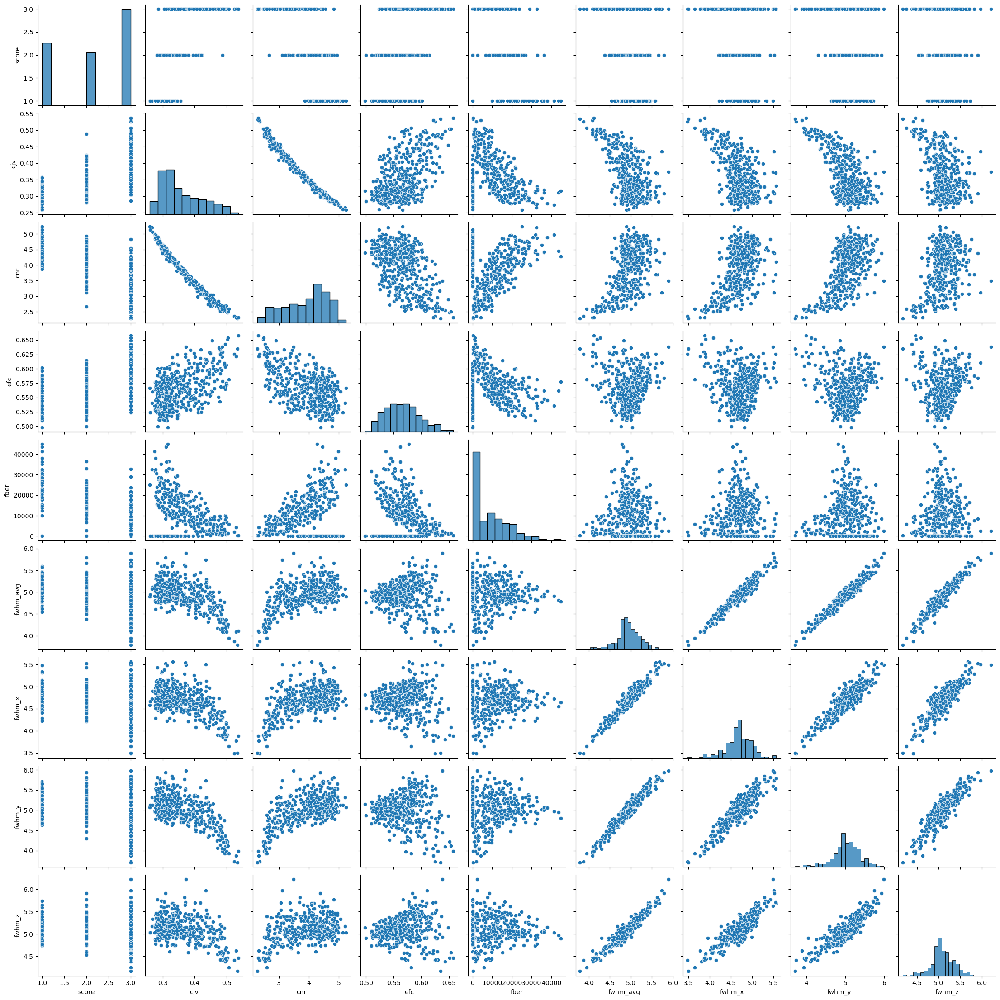

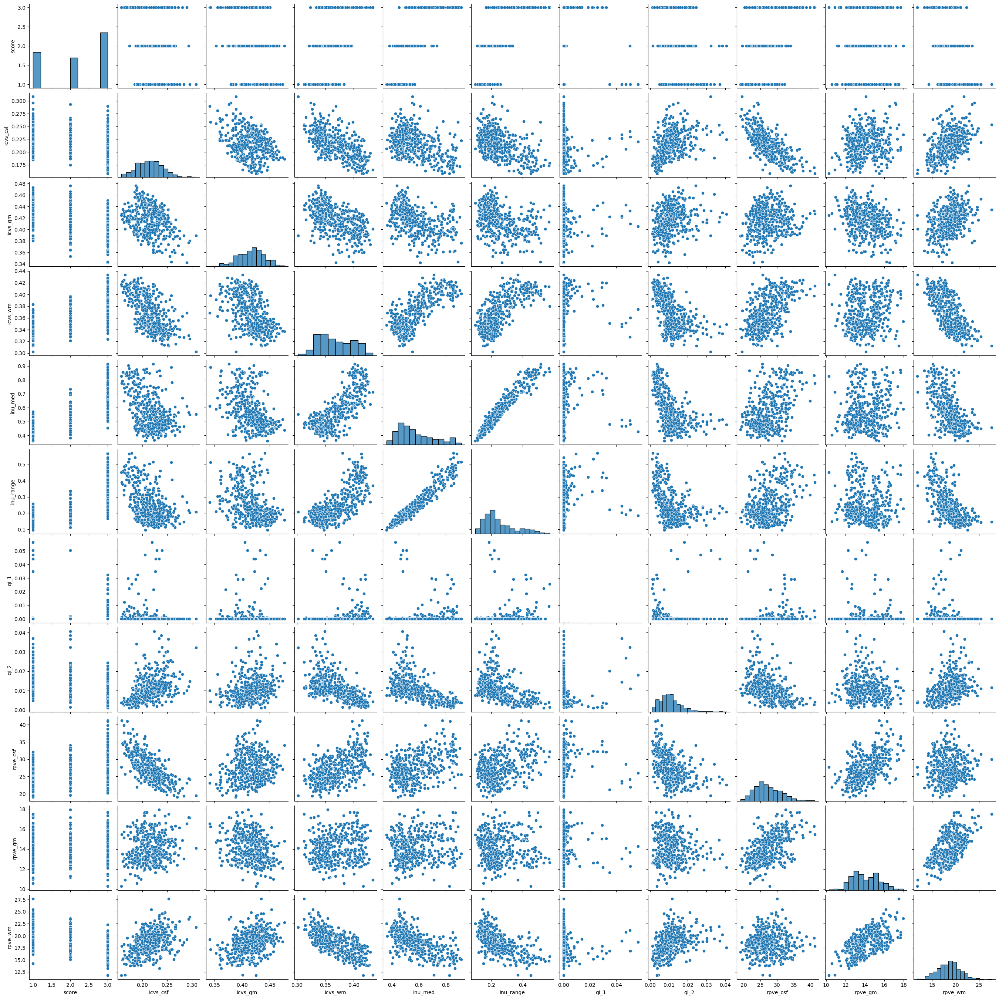

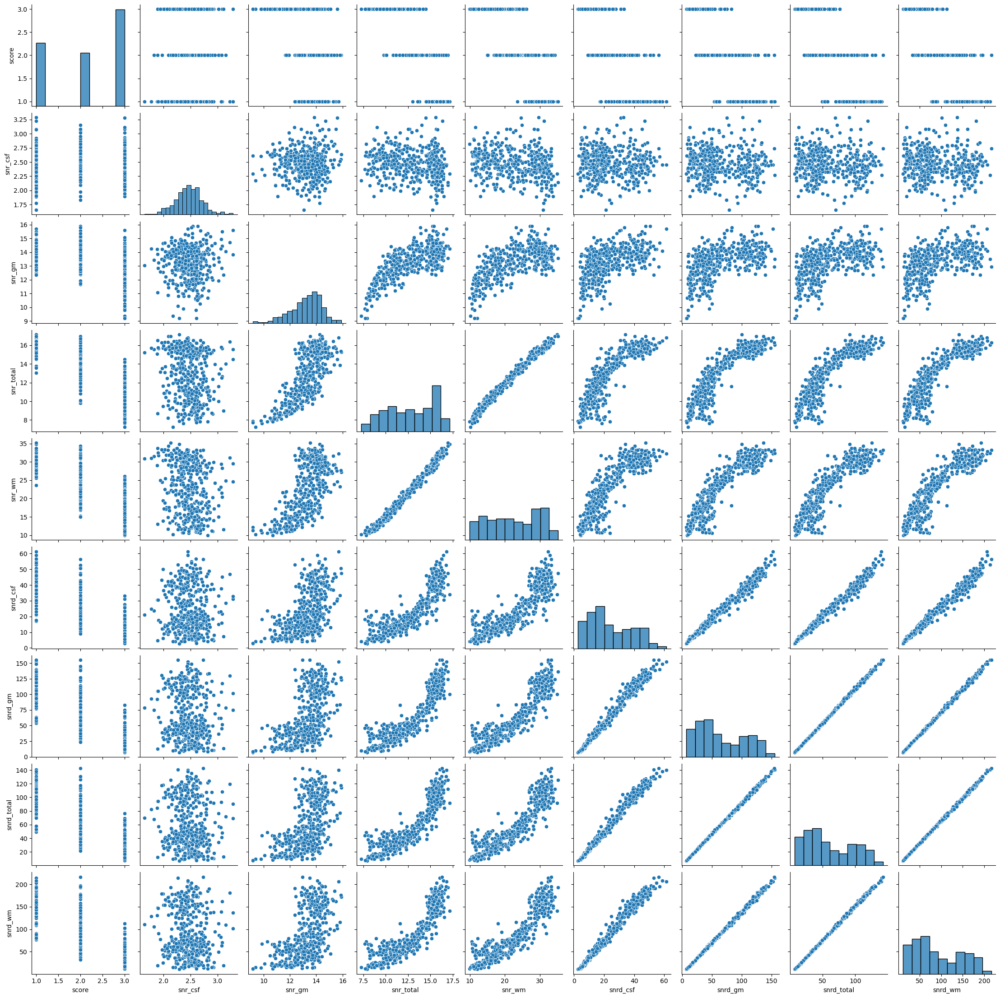

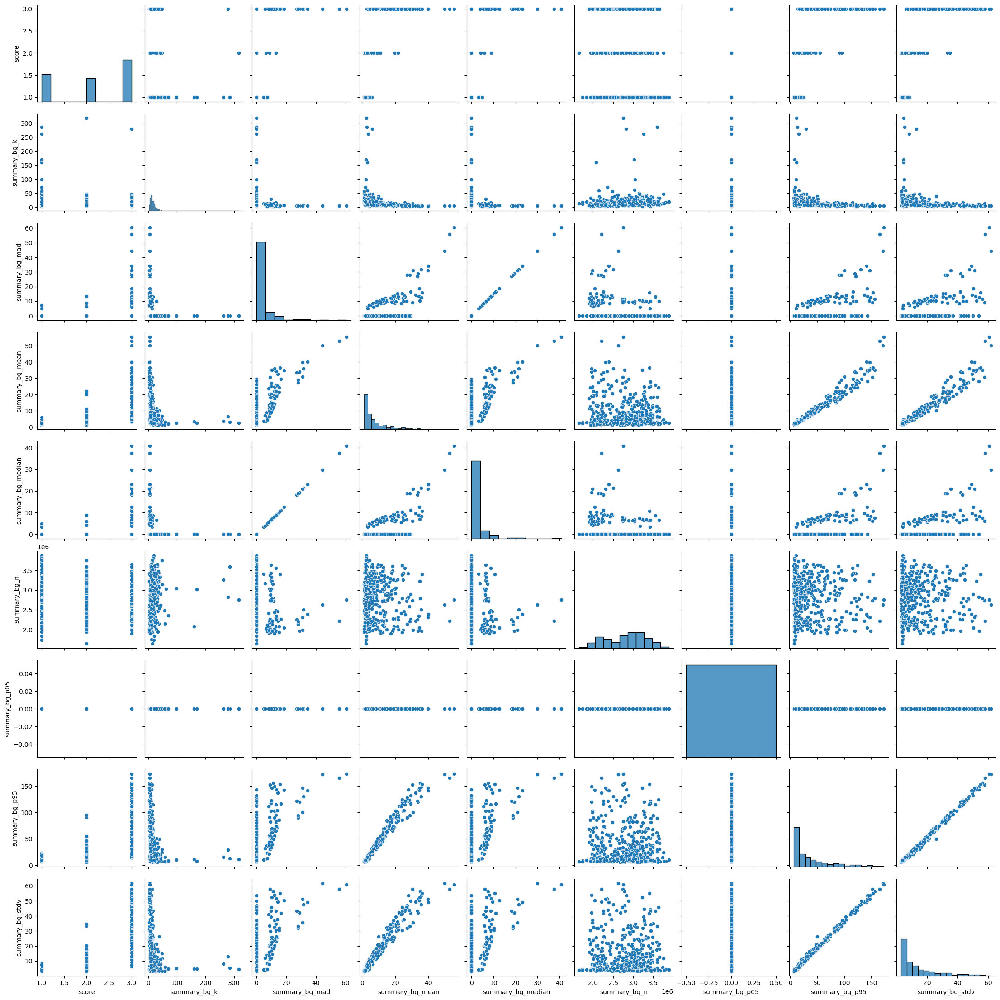

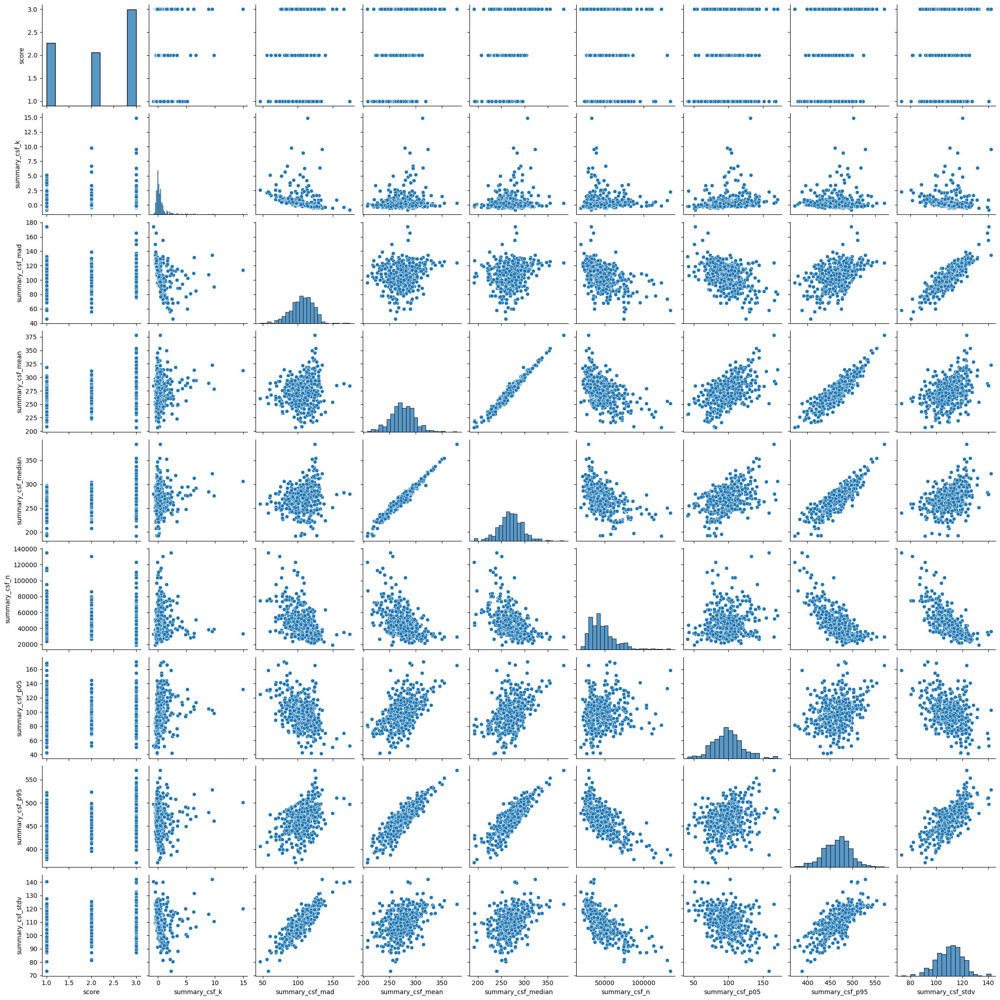

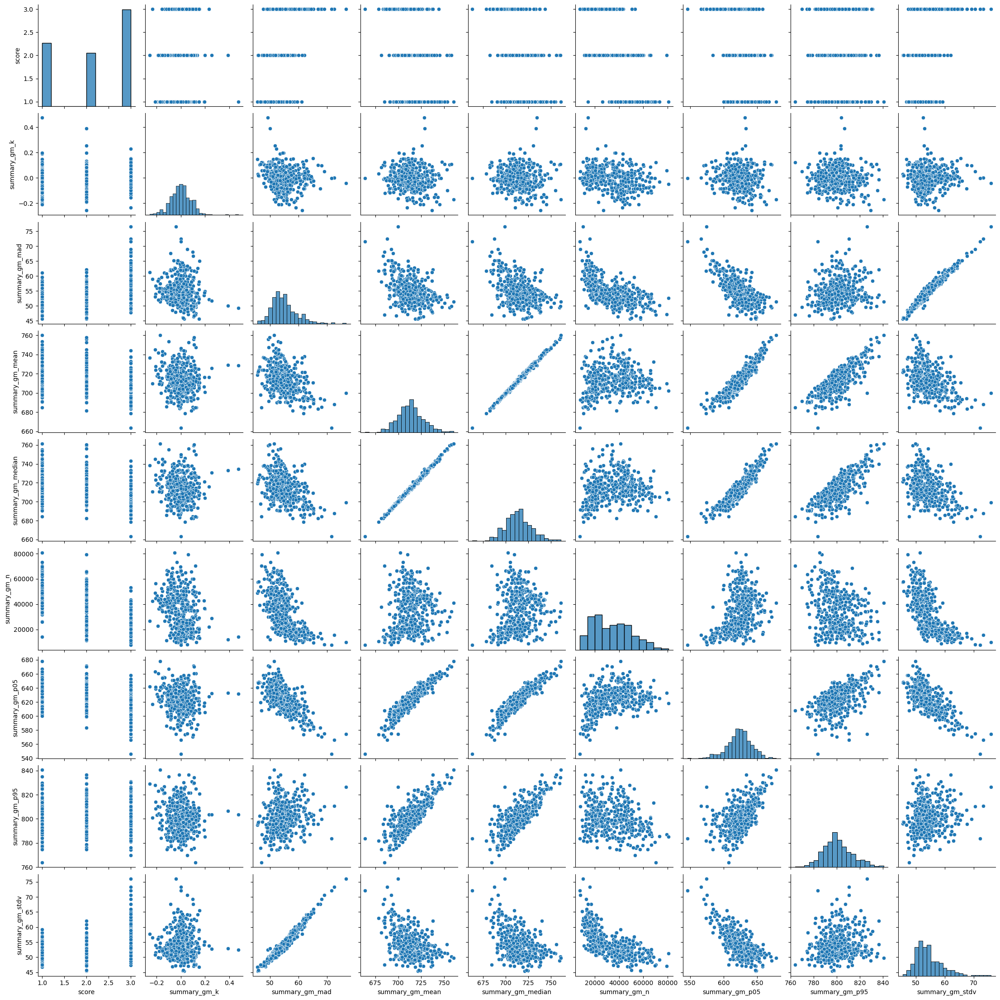

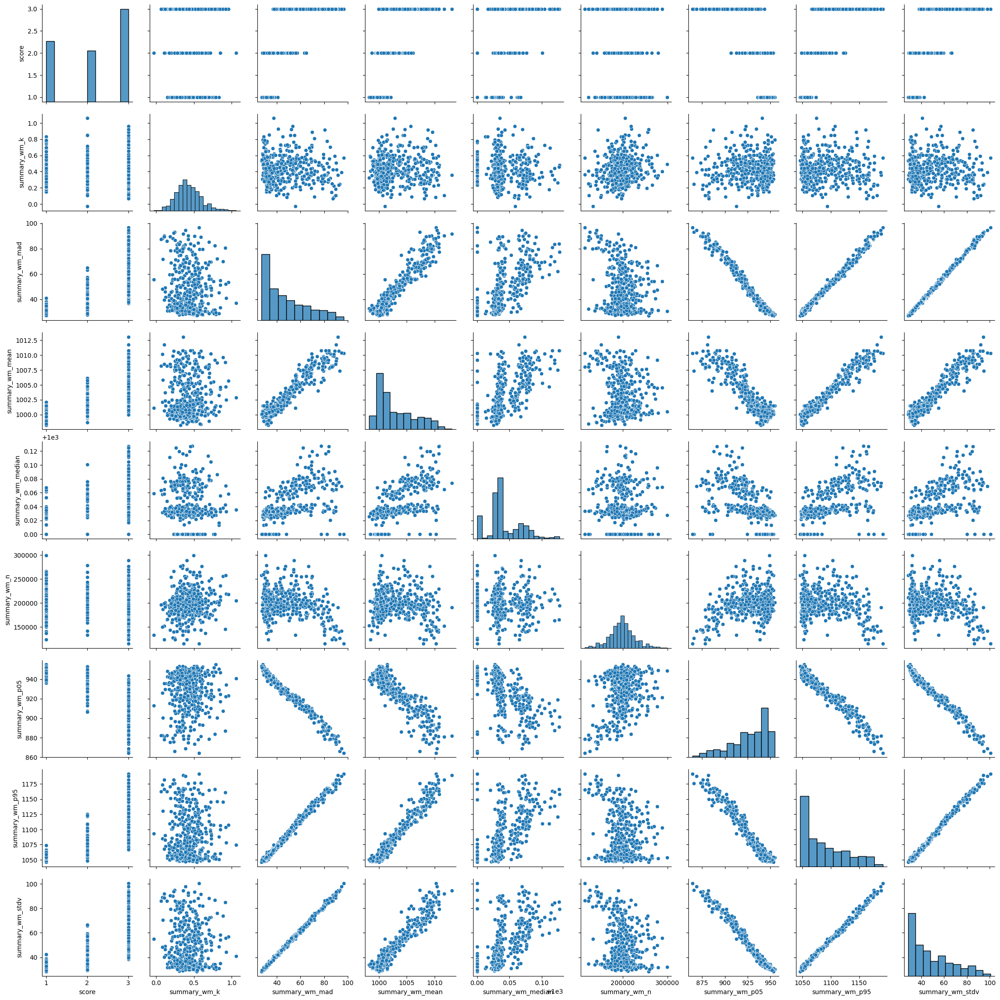

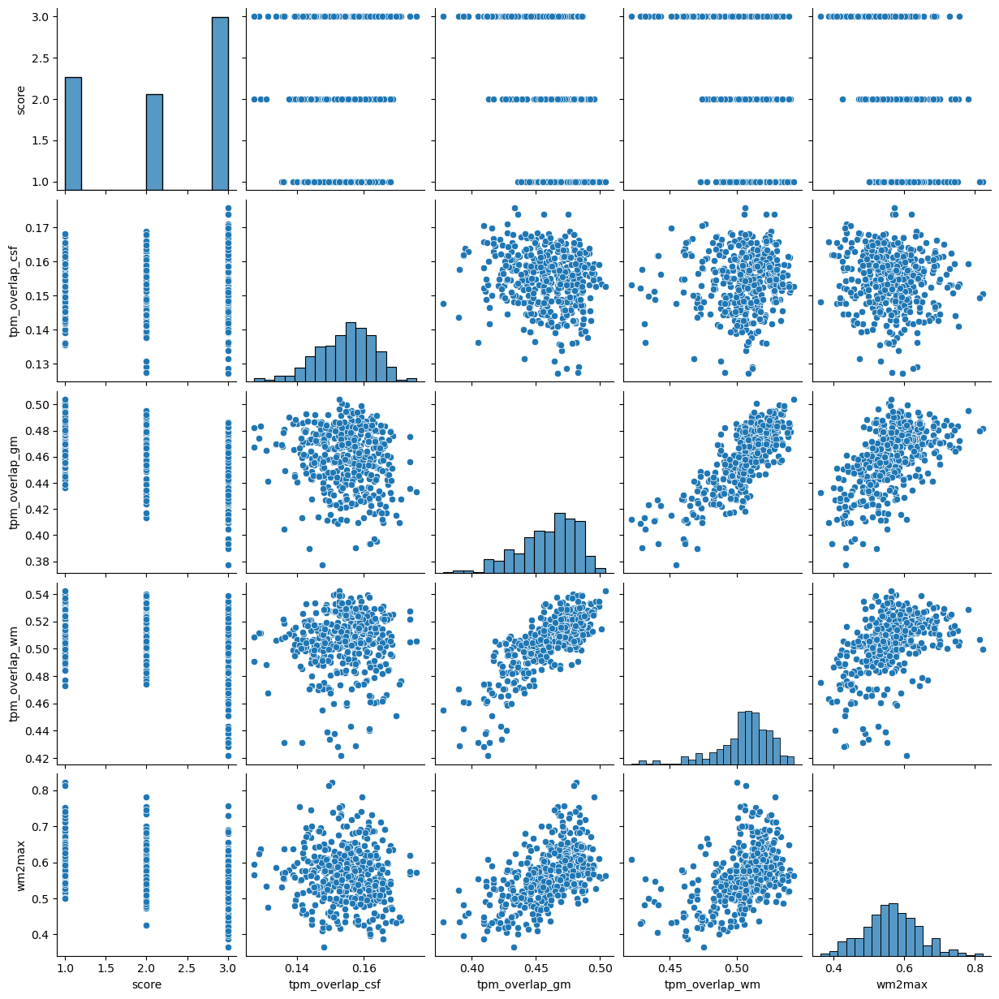

In [93]:
for metrics_set in metrics_sets.values():
    sns.pairplot(data_df[metrics_set])

In [55]:
data_df.shape

(436, 63)

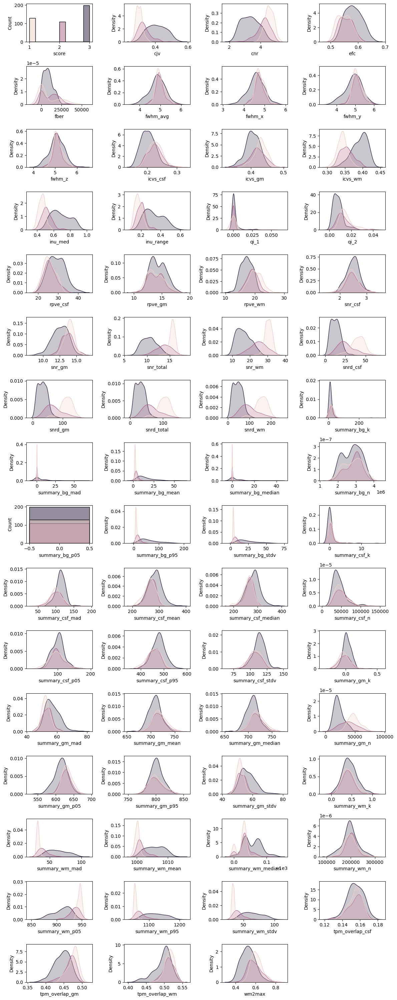

In [299]:
# Catch warning to plot barplots when data which cannot be shown as distributions
import warnings
warnings.filterwarnings("error")

n_metrics = len(data_df.columns) - 1 # First column score is not a metric (hence - 1)
n_cols = 4
n_rows = n_metrics // n_cols if n_metrics % n_cols == 0 else (n_metrics // n_cols)  + 1
plt.figure(figsize=(12, 30))
for i, column in enumerate(data_df.columns, 1): # start counting from 1 (enumerate second arg) because subplot needs that
    plt.subplot(n_rows, n_cols, i)
    if i==1:
        try: 
            sns.kdeplot(data_df, x=column, hue="score", fill=True)
        except UserWarning:
            sns.histplot(data_df, x=column, hue="score", fill=True, legend=False)
    else:
        try: 
            sns.kdeplot(data_df, x=column, hue="score", fill=True, legend=False)
        except UserWarning:
            sns.histplot(data_df, x=column, hue="score", fill=True, legend=False)
plt.tight_layout()

In [300]:
# Reset warnings to default
import warnings
warnings.filterwarnings("default")

## Learning

### Elastic Net

In [248]:
from sklearn.model_selection import train_test_split
X_np = X.to_numpy()
y_np = y.to_numpy()
X_cv, X_final_test, y_cv, y_final_test = train_test_split(X_np, y_np, test_size=0.1, 
                                                          stratify=y_np, random_state=42)

In [253]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay

In [255]:
n_cpus=20
n_folds = 10
# Save accuracy performance and hyper parameter values selected in inner CV
accuracy_perf = {'train': np.zeros(n_folds),
                 'test': np.zeros(n_folds)}
best_hyperparams = {'C': [],
                    'l1_ratio': []}
# Save model parameters at each iteration
lr_params = []
skf = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=42)
# Iterate over each set of folds
for i_fold, (train_ix, test_ix) in enumerate(skf.split(X_cv, y_cv)):
    # test_ix is for our left out fold, and train_ix is from combining all other folds
    X_train, X_test = X_cv[train_ix], X_cv[test_ix]
    y_train, y_test = y_cv[train_ix], y_cv[test_ix]
    # Define pipeline adding scaling step before logistic regression model fitting
    lr_pipeline = Pipeline(
        [('scaler', StandardScaler()),
         ('lr', LogisticRegression(penalty='elasticnet', solver='saga',
                                   max_iter=10000, class_weight='balanced'))]
    )
    # Define the grid search using the previously given names with "dudder" __
    grid_search = GridSearchCV(lr_pipeline, n_jobs=n_cpus,
                               param_grid={'lr__C': [0.1, 0.5, 1.0, 5.0, 10, 50, 100],
                                           'lr__l1_ratio': np.linspace(0, 1, 11)})
    # Fit as before, but use the grid search object
    grid_search.fit(X_train, y_train)
    # Get performance on training and test set (test set = left out fold)
    best_hyperparams['C'].append(grid_search.best_params_['lr__C'])
    best_hyperparams['l1_ratio'].append(grid_search.best_params_['lr__l1_ratio'])
    best_lr = grid_search.best_estimator_
    accuracy_perf['train'][i_fold] = accuracy_score(y_train, best_lr.predict(X_train))
    accuracy_perf['test'][i_fold] = accuracy_score(y_test, best_lr.predict(X_test))
    # Get model parameters
    lr_params.append(best_lr['lr'].coef_[0])

In [257]:
lr_params_df = pd.DataFrame(lr_params, columns=X.columns)

In [258]:
best_hyperparams

{'C': [0.1, 0.5, 0.1, 0.1, 0.1, 0.1, 0.5, 0.1, 0.1, 0.1],
 'l1_ratio': [1.0,
  0.4,
  0.5,
  0.7000000000000001,
  0.0,
  0.7000000000000001,
  1.0,
  0.7000000000000001,
  0.30000000000000004,
  0.2]}

In [259]:
accuracy_perf

{'train': array([0.80397727, 0.86363636, 0.8470255 , 0.83002833, 0.85835694,
        0.82719547, 0.84985836, 0.83002833, 0.83852691, 0.83286119]),
 'test': array([0.825     , 0.85      , 0.69230769, 0.71794872, 0.76923077,
        0.82051282, 0.87179487, 0.79487179, 0.74358974, 0.87179487])}

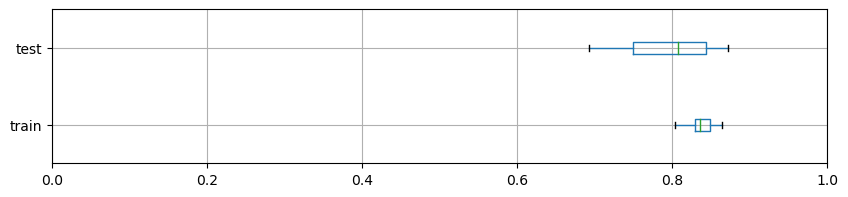

In [260]:
plt.figure(figsize=(10, 2))
pd.DataFrame(accuracy_perf).boxplot(vert=False);
plt.xlim(0, 1);

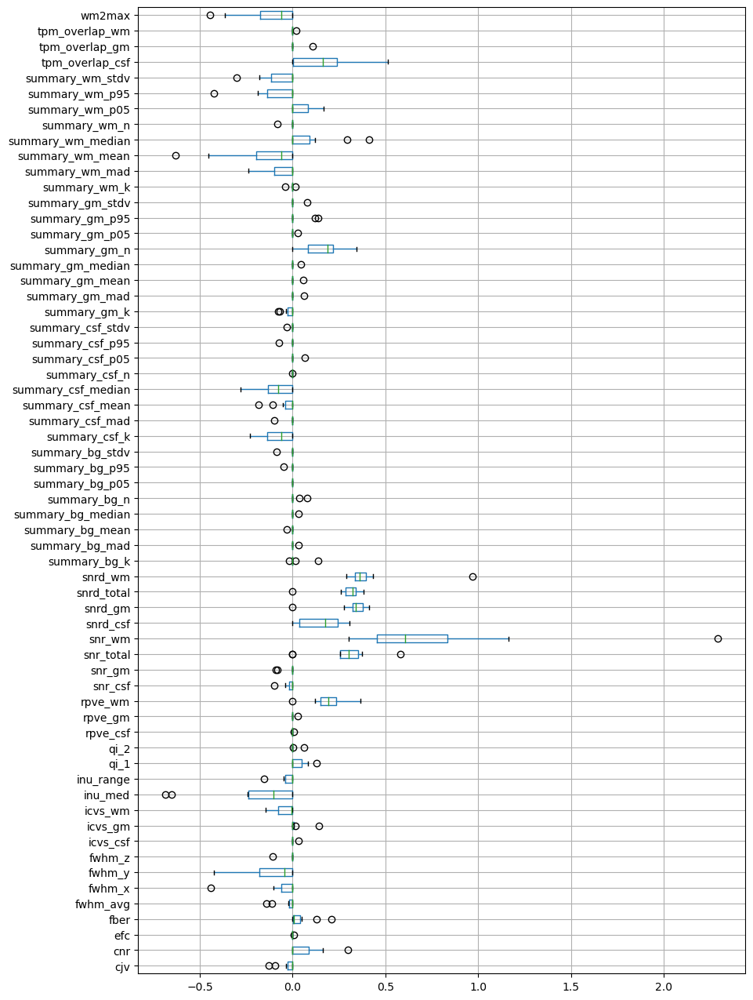

In [261]:
plt.figure(figsize=(10, 16))
lr_params_df.boxplot(vert=False);

### Test on hold-out test data

In [262]:
lr_pipeline = Pipeline(
    [('scaler', StandardScaler()),
     ('lr', LogisticRegression(penalty='elasticnet', solver='saga', max_iter=10000,
                               C=1, l1_ratio=0.7, class_weight='balanced'))]
)
lr_pipeline.fit(X_cv, y_cv)
print(f"Training accuracy: {accuracy_score(y_cv, lr_pipeline.predict(X_cv))}")
print(f"Hold out dataset test accuracy: {accuracy_score(y_final_test, lr_pipeline.predict(X_final_test))}")

Training accuracy: 0.8698979591836735
Hold out dataset test accuracy: 0.8181818181818182


### Visualize model coefficients

#### Get median coefficients across all CV folds

In [277]:
median_df = pd.DataFrame({"median": lr_params_df.median()})
median_df

,median
cjv,0.000000
cnr,0.000000
efc,0.000000
fber,0.006007
fwhm_avg,0.000000
...,...
summary_wm_stdv,0.000000
tpm_overlap_csf,0.163758
tpm_overlap_gm,0.000000
tpm_overlap_wm,0.000000


#### Plot sorted by values

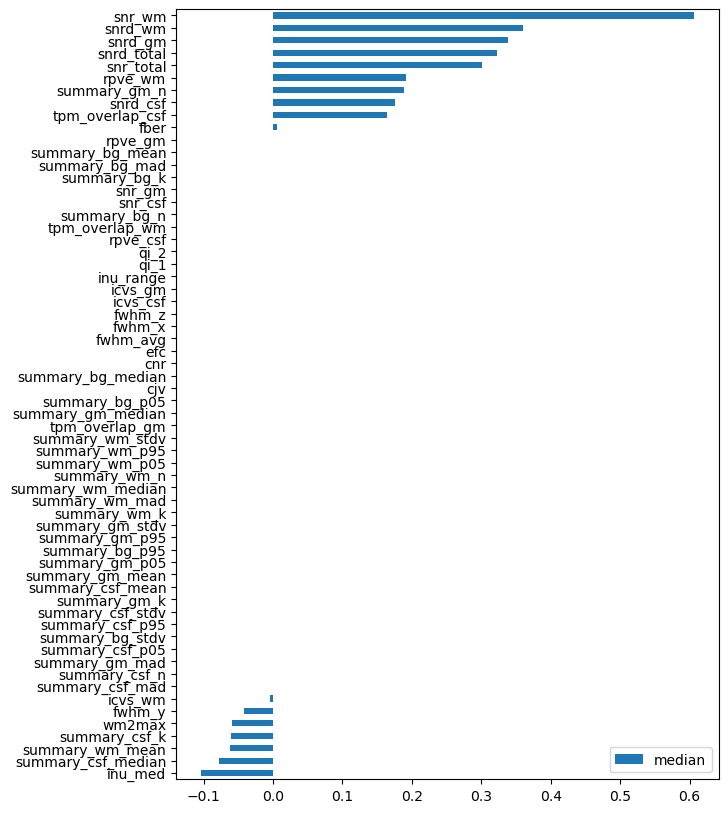

In [296]:
median_df.sort_values(by='median').plot(kind="barh", legend=True, figsize=(7,10));

In [288]:
median_df.plot?

#### Plot as stem

<StemContainer object of 3 artists>

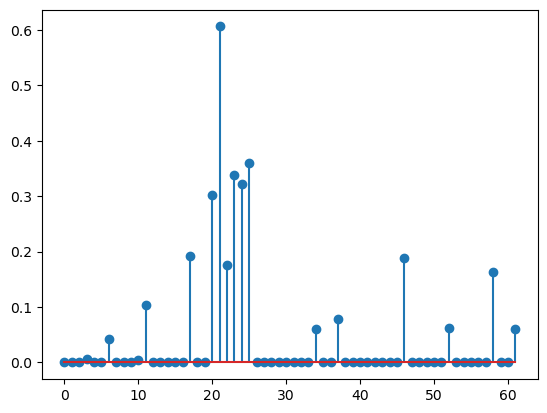

In [284]:
plt.stem("median", kind=data=median_df.abs())

In [301]:
radar_lg_df = pd.DataFrame({'r': median_df["median"], 'theta': median_df.index})
radar_lg_df["r_abs"] = radar_lg_df["r"].abs()
plt.figure(figsize=(12,18))
fig = px.line_polar(radar_lg_df, r='r_abs', theta='theta', line_close=True, width=800, height=800)
fig

/home/michael/miniconda3/envs/ds310/lib/python3.10/site-packages/plotly/express/_core.py:271: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hovertemplate': 'r_abs=%{r}<br>theta=%{theta}<extra></extra>',
              'legendgroup': '',
              'line': {'color': '#636efa', 'dash': 'solid'},
              'marker': {'symbol': 'circle'},
              'mode': 'lines',
              'name': '',
              'r': array([0.        , 0.        , 0.        , 0.00600671, 0.        , 0.        ,
                          0.04182979, 0.        , 0.        , 0.        , 0.00480094, 0.10388713,
                          0.        , 0.        , 0.        , 0.        , 0.        , 0.191733  ,
                          0.        , 0.        , 0.30149442, 0.60638196, 0.1750201 , 0.33842009,
                          0.32272035, 0.36013019, 0.        , 0.        , 0.        , 0.        ,
                          0.        , 0.        , 0.        , 0.        , 0.0611885 , 0.        ,
                          0.        , 0.07798078, 0.        , 0.        , 0.        , 0.        ,
                          0.        , 0.        , 0.        , 0.        , 0.18858441, 0.        ,
                          0.        , 0.        , 0.        , 0.        , 0.06252373, 0.        ,
                          0.        , 0.        , 0.        , 0.        , 0.16375779, 0.        ,
                          0.        , 0.05977893, 0.        ]),
              'showlegend': False,
              'subplot': 'polar',
              'theta': array(['cjv', 'cnr', 'efc', 'fber', 'fwhm_avg', 'fwhm_x', 'fwhm_y', 'fwhm_z',
                              'icvs_csf', 'icvs_gm', 'icvs_wm', 'inu_med', 'inu_range', 'qi_1',
                              'qi_2', 'rpve_csf', 'rpve_gm', 'rpve_wm', 'snr_csf', 'snr_gm',
                              'snr_total', 'snr_wm', 'snrd_csf', 'snrd_gm', 'snrd_total', 'snrd_wm',
                              'summary_bg_k', 'summary_bg_mad', 'summary_bg_mean',
                              'summary_bg_median', 'summary_bg_n', 'summary_bg_p05', 'summary_bg_p95',
                              'summary_bg_stdv', 'summary_csf_k', 'summary_csf_mad',
                              'summary_csf_mean', 'summary_csf_median', 'summary_csf_n',
                              'summary_csf_p05', 'summary_csf_p95', 'summary_csf_stdv',
                              'summary_gm_k', 'summary_gm_mad', 'summary_gm_mean',
                              'summary_gm_median', 'summary_gm_n', 'summary_gm_p05', 'summary_gm_p95',
                              'summary_gm_stdv', 'summary_wm_k', 'summary_wm_mad', 'summary_wm_mean',
                              'summary_wm_median', 'summary_wm_n', 'summary_wm_p05', 'summary_wm_p95',
                              'summary_wm_stdv', 'tpm_overlap_csf', 'tpm_overlap_gm',
                              'tpm_overlap_wm', 'wm2max', 'cjv'], dtype=object),
              'type': 'scatterpolar'}],
    'layout': {'height': 800,
               'legend': {'tracegroupgap': 0},
               'margin': {'t': 60},
               'polar': {'angularaxis': {'direction': 'clockwise', 'rotation': 90},
                         'domain': {'x': [0.0, 1.0], 'y': [0.0, 1.0]}},
               'template': '...',
               'width': 800}
})

<Figure size 1200x1800 with 0 Axes>

## PLS

In [160]:
from sklearn.model_selection import train_test_split
from sklearn.cross_decomposition import PLSRegression

In [158]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,
                                                    random_state=42, shuffle=True, stratify=y)

In [161]:
pls = PLSRegression(n_components=1)
pls.fit(X_train, y_train)

PLSRegression(n_components=1)

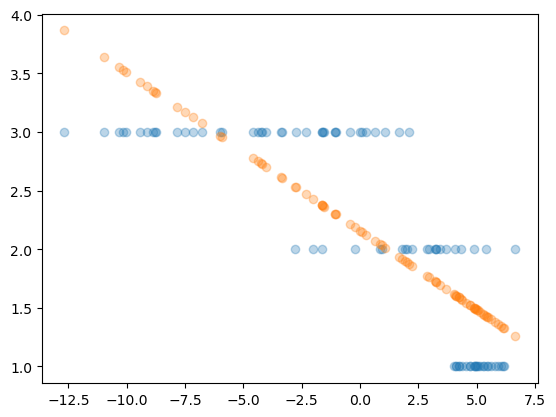

In [162]:
plt.scatter(pls.transform(X_test), y_test, alpha=0.3, label="ground truth")
plt.scatter(pls.transform(X_test), pls.predict(X_test), alpha=0.3, label="predictions")

In [213]:
from sklearn.preprocessing import OneHotEncoder
enc = OneHotEncoder()

In [218]:
y_train_dummies = pd.get_dummies(y_train)
y_train_dummies

,1,2,3
168,0,1,0
101,0,0,1
48,0,0,1
131,0,0,1
196,0,1,0
...,...,...,...
97,0,0,1
31,0,0,1
176,1,0,0
85,0,1,0


In [219]:
from sklearn.cross_decomposition import PLSRegression

# fit the pls regression
my_plsr = PLSRegression(n_components=2, scale=True)
my_plsr.fit(X_train, y_train_dummies)

PLSRegression()

In [226]:
my_plsr.predict(X_test).argmax(axis=1)

array([2, 2, 2, 2, 0, 2, 1, 2, 0, 2, 0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 2, 0,
       2, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 1, 2, 0, 0, 2, 2, 0, 0, 0, 0,
       0, 2, 0, 2, 2, 0, 2, 1, 0, 2, 0, 0, 2, 2, 2, 2, 0, 2, 2, 0, 0, 2,
       2, 2, 0, 0, 2, 0, 2, 2, 2, 0, 0, 2, 2, 2, 0, 2, 0, 0, 2, 1, 2, 2])

In [229]:
np.array(y_test-1)

array([2, 1, 2, 2, 1, 1, 1, 2, 1, 2, 1, 1, 0, 2, 2, 2, 0, 2, 0, 0, 2, 1,
       1, 0, 1, 0, 0, 2, 2, 2, 1, 2, 1, 2, 1, 2, 1, 0, 2, 2, 0, 2, 0, 0,
       1, 2, 0, 2, 2, 0, 1, 1, 0, 2, 0, 0, 2, 2, 2, 2, 1, 2, 1, 0, 0, 2,
       2, 2, 0, 0, 2, 0, 1, 2, 2, 0, 1, 2, 2, 2, 0, 2, 0, 0, 1, 0, 2, 2])

In [230]:
from sklearn.metrics import confusion_matrix
y_true = y_test-1
y_pred = my_plsr.predict(X_test).argmax(axis=1)
confusion_matrix(y_true, y_pred)

array([[25,  1,  0],
       [10,  3,  9],
       [ 1,  0, 39]])

In [235]:
my_plsr.x_loadings_

array([[-0.18919015,  0.04105295],
       [ 0.18877334, -0.00555508],
       [-0.12150773, -0.03851045],
       [ 0.02851735, -0.1128053 ],
       [ 0.09758868, -0.36561849],
       [ 0.10540086, -0.34068981],
       [ 0.1095328 , -0.34729463],
       [ 0.06206622, -0.37418809],
       [ 0.10312923, -0.1469164 ],
       [ 0.09929438,  0.23564279],
       [-0.17320042, -0.06681201],
       [-0.18923685, -0.00239078],
       [-0.17872321,  0.00319803],
       [-0.01247313,  0.0780924 ],
       [ 0.12655914, -0.03331571],
       [-0.10117805,  0.09927124],
       [-0.02355949, -0.09388988],
       [ 0.13054412,  0.05110526],
       [-0.01921337,  0.03998771],
       [ 0.15109214, -0.04320992],
       [ 0.19323646,  0.06884958],
       [ 0.1905745 ,  0.08249127],
       [ 0.16882522,  0.24127131],
       [ 0.17312408,  0.21629017],
       [ 0.17275215,  0.21956129],
       [ 0.17308105,  0.21574837],
       [ 0.04464626, -0.03065004],
       [-0.10381458,  0.14719733],
       [-0.17828612,

In [223]:
my_plsr.coef_

array([[-8.26291691e-03, -4.31006678e-03,  1.25729837e-02],
       [ 1.21858731e-02,  3.27945014e-03, -1.54653232e-02],
       [-3.19650668e-03, -3.65903668e-03,  6.85554336e-03],
       [-8.86669656e-03,  3.43506553e-03,  5.43163104e-03],
       [-2.00349989e-02,  8.34036040e-03,  1.16946386e-02],
       [-1.63709255e-02,  7.76746777e-03,  8.60345772e-03],
       [-2.06636607e-02,  8.94502505e-03,  1.17186356e-02],
       [-2.09628255e-02,  7.22323743e-03,  1.37395881e-02],
       [-8.77848723e-04,  4.14639930e-03, -3.26855058e-03],
       [ 2.06453414e-02, -2.10519897e-03, -1.85401424e-02],
       [-1.63948238e-02, -1.89374579e-03,  1.82885696e-02],
       [-1.09803011e-02, -3.75529583e-03,  1.47355969e-02],
       [-6.09683524e-03, -4.88748890e-03,  1.09843241e-02],
       [ 1.77599072e-02, -5.61670433e-03, -1.21432028e-02],
       [ 5.65689233e-03,  2.76184726e-03, -8.41873960e-03],
       [-1.53048473e-03, -3.44020066e-03,  4.97068539e-03],
       [-9.82271698e-03,  1.70988744e-03

In [232]:
my_plsr.coef_

array([[-8.26291691e-03, -4.31006678e-03,  1.25729837e-02],
       [ 1.21858731e-02,  3.27945014e-03, -1.54653232e-02],
       [-3.19650668e-03, -3.65903668e-03,  6.85554336e-03],
       [-8.86669656e-03,  3.43506553e-03,  5.43163104e-03],
       [-2.00349989e-02,  8.34036040e-03,  1.16946386e-02],
       [-1.63709255e-02,  7.76746777e-03,  8.60345772e-03],
       [-2.06636607e-02,  8.94502505e-03,  1.17186356e-02],
       [-2.09628255e-02,  7.22323743e-03,  1.37395881e-02],
       [-8.77848723e-04,  4.14639930e-03, -3.26855058e-03],
       [ 2.06453414e-02, -2.10519897e-03, -1.85401424e-02],
       [-1.63948238e-02, -1.89374579e-03,  1.82885696e-02],
       [-1.09803011e-02, -3.75529583e-03,  1.47355969e-02],
       [-6.09683524e-03, -4.88748890e-03,  1.09843241e-02],
       [ 1.77599072e-02, -5.61670433e-03, -1.21432028e-02],
       [ 5.65689233e-03,  2.76184726e-03, -8.41873960e-03],
       [-1.53048473e-03, -3.44020066e-03,  4.97068539e-03],
       [-9.82271698e-03,  1.70988744e-03

In [187]:
radar_df = pd.DataFrame({'r': pls.coef_.flatten(), 'theta': list(X.columns)})

In [177]:
import importlib
import plotly
importlib.reload(plotly.express)

<module 'plotly.express' from '/home/michael/miniconda3/envs/ds310/lib/python3.10/site-packages/plotly/express/__init__.py'>

In [178]:
import plotly.express as px
import pandas as pd
df = pd.DataFrame(dict(
    r=[1, 5, 2, 2, 3],
    theta=['processing cost','mechanical properties','chemical stability',
           'thermal stability', 'device integration']))
df

,r,theta
0,1,processing cost
1,5,mechanical properties
2,2,chemical stability
3,2,thermal stability
4,3,device integration


In [180]:
import nbformat
nbformat.__version__

'5.7.0'

In [209]:
radar_df["r"].abs()

0     0.024281
1     0.025110
2     0.015864
3     0.001753
4     0.006701
        ...   
57    0.025700
58    0.001032
59    0.019170
60    0.012893
61    0.016526
Name: r, Length: 62, dtype: float64

In [210]:
radar_df["r_abs"] = radar_df["r"].abs()

In [211]:
plt.figure(figsize=(12,18))
fig = px.line_polar(radar_df, r='r_abs', theta='theta', line_close=True, width=800, height=800)
fig

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hovertemplate': 'r_abs=%{r}<br>theta=%{theta}<extra></extra>',
              'legendgroup': '',
              'line': {'color': '#636efa', 'dash': 'solid'},
              'marker': {'symbol': 'circle'},
              'mode': 'lines',
              'name': '',
              'r': array([0.02428132, 0.02511018, 0.0158639 , 0.00175259, 0.00670142, 0.0086852 ,
                          0.00805123, 0.00196668, 0.01289853, 0.01608922, 0.02471427, 0.02521353,
                          0.0233595 , 0.00122569, 0.01608266, 0.01317255, 0.00506094, 0.01838461,
                          0.00197032, 0.0179849 , 0.02833292, 0.02861064, 0.02808228, 0.02860063,
                          0.028561  , 0.02858687, 0.00543523, 0.01091529, 0.02081177, 0.01091529,
                          0.00185357, 0.        , 0.02193817, 0.0222908 , 0.00361726, 0.01212226,
                          0.01037239, 0.01125583, 0.00325799, 0.00161474, 0.00871773, 0.00862749,
                          0.00770956, 0.01516029, 0.01102793, 0.01175313, 0.02400646, 0.01498904,
                          0.00012006, 0.0171331 , 0.00273954, 0.02557998, 0.02488494, 0.01796989,
                          0.00012813, 0.02533593, 0.02573282, 0.02569996, 0.00103229, 0.01916967,
                          0.01289307, 0.01652618, 0.02428132]),
              'showlegend': False,
              'subplot': 'polar',
              'theta': array(['cjv', 'cnr', 'efc', 'fber', 'fwhm_avg', 'fwhm_x', 'fwhm_y', 'fwhm_z',
                              'icvs_csf', 'icvs_gm', 'icvs_wm', 'inu_med', 'inu_range', 'qi_1',
                              'qi_2', 'rpve_csf', 'rpve_gm', 'rpve_wm', 'snr_csf', 'snr_gm',
                              'snr_total', 'snr_wm', 'snrd_csf', 'snrd_gm', 'snrd_total', 'snrd_wm',
                              'summary_bg_k', 'summary_bg_mad', 'summary_bg_mean',
                              'summary_bg_median', 'summary_bg_n', 'summary_bg_p05', 'summary_bg_p95',
                              'summary_bg_stdv', 'summary_csf_k', 'summary_csf_mad',
                              'summary_csf_mean', 'summary_csf_median', 'summary_csf_n',
                              'summary_csf_p05', 'summary_csf_p95', 'summary_csf_stdv',
                              'summary_gm_k', 'summary_gm_mad', 'summary_gm_mean',
                              'summary_gm_median', 'summary_gm_n', 'summary_gm_p05', 'summary_gm_p95',
                              'summary_gm_stdv', 'summary_wm_k', 'summary_wm_mad', 'summary_wm_mean',
                              'summary_wm_median', 'summary_wm_n', 'summary_wm_p05', 'summary_wm_p95',
                              'summary_wm_stdv', 'tpm_overlap_csf', 'tpm_overlap_gm',
                              'tpm_overlap_wm', 'wm2max', 'cjv'], dtype=object),
              'type': 'scatterpolar'}],
    'layout': {'height': 800,
               'legend': {'tracegroupgap': 0},
               'margin': {'t': 60},
               'polar': {'angularaxis': {'direction': 'clockwise', 'rotation': 90},
                         'domain': {'x': [0.0, 1.0], 'y': [0.0, 1.0]}},
               'template': '...',
               'width': 800}
})

<Figure size 1200x1800 with 0 Axes>

In [237]:
y

0      1
1      2
2      3
3      1
4      3
      ..
431    2
432    2
433    1
434    3
435    3
Name: score, Length: 436, dtype: int64